# Mixed Membership Stochastic Blockmodel(MMSBM)

In [7]:
from graspologic import simulations

import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

Stochaistic Block Model(SBM) produces graphs containing communities: disjoint subgraphs characterized by differing edge probabilities for vertices within and between communities. 

Given a network with $k$ number of communities, a SBM is parametrized by the number of vertices in each community $n$; a block connectivity matrix	$B\in R^{kxk}$ where each $(i^{th}, j^{th})$ entry specifies the probability of connection between nodes pertaining to the $i^{th}$ community and the $j^{th}$ community; and a membership matrix $Z\in R^{nxk}$ in which the $i^{th}$ row vector contains information regarding which of the $k$ communities the node $i$ pertains to. In fact, for any $i^{th}$ row of $Z$ each $j^{th}$ entry indicates the probability of the node $i$ pertaining to the community $j$. Each edge between nodes is then sampled from Bernoulli distribution according to a probability matrix $P\in R^{nxn}$ such that $P$ = $Z B Z^{T}$ and each $(i^{th}, j^{th})$ entry indicates the probability of connection between node $i$ and $j$.

One drawback of utilizing SBM is that each node must be assigned exclusevily to a single community. Therefore each row of $Z$ contains $1$ in the $j^{th}$ column indicating the community to which that node belongs to and 0 for all the other entries. 

The Mixed Membership Stochaistic Block Model(MMSBM) addresses this issue by adding some variability in the community assignment process to each node. Indeed, given a network with $k$ communities and a connectivity matrix $B\in R^{kxk}$ each node $p$ is assigned a membership vector $\vec{\pi}_p$. As aforementioned, the $i^{th}$ entry of this vector indicates the probability of node $p$ pertaining to the $i^{th}$ community when interactong with another node. Differently from SBM, a node is allowed to pertain to multiple communities. This is achieved by estimating how often a node act as belonging to a community with respect to another when forming connections with other nodes. In MMSBM, this assignment is performed by sampling each membership vector $\vec{\pi}_p$ from a Dirichlet distribution with parameter $\alpha$ so that when $\alpha$ is low nodes can mostly pertain to only one community and the model resembles a typical SBM while as $\alpha$ increases mixed membership is allowed. The magnitude of mixed membership allowed is dependent upon the parameter alpha so that when alpha is high enough the block structure is completly lost as all blocks will pertain to all communities with the same probability.

To show this we sample a four-block SBM(undirected, no self-loops) graph with following parameters:

$$
\begin{aligned}
n=\begin{bmatrix} 50 & 50 & 50 & 50 \end{bmatrix}\\
k = 4\\
P=\begin{bmatrix} 0.8 & 0.2 & 0.2 & 0.2 \\ 0.2 & 0.8 & 0.2 & 0.2 \\ 0.2 & 0.2 & 0.8 & 0.2 \\ 0.2 & 0.2 & 0.2 & 0.8\end{bmatrix}\\
\end{aligned}
$$

Similarly, we also sample a 200 nodes graph from MMSBM with the following parameters:

$$
\begin{aligned}
n=200\\
k = 4\\
\alpha = \begin{bmatrix} 0 & 0 & 0 & 0 \end{bmatrix}\\
P=\begin{bmatrix} 0.8 & 0.2 & 0.2 & 0.2 \\ 0.2 & 0.8 & 0.2 & 0.2 \\ 0.2 & 0.2 & 0.8 & 0.2 \\ 0.2 & 0.2 & 0.2 & 0.8 \end{bmatrix}
\end{aligned}
$$

Notice that due to the random sampling of mixed membership vectors of MMSBM we do not specify the number of vertices per block but rather the total number of vertices.


In [ ]:
from graspologic.simulations import sbm

n = [50] * 4
p = [[0.8,0.2,0.2,0.2],
    [ 0.2,0.8,0.2,0.2],
    [ 0.2,0.2,0.8,0.2],
    [ 0.2,0.2,0.2,0.8]]

G_sbm = sbm(n, p, directed=False, loops=False)

n= 200
k = 4
alpha = np.zeros(4)

G_mmsbm = MMsbm(n, p, alpha= alpha, loops=False)

# Plot SBM and MMSBM graphs using heatmap

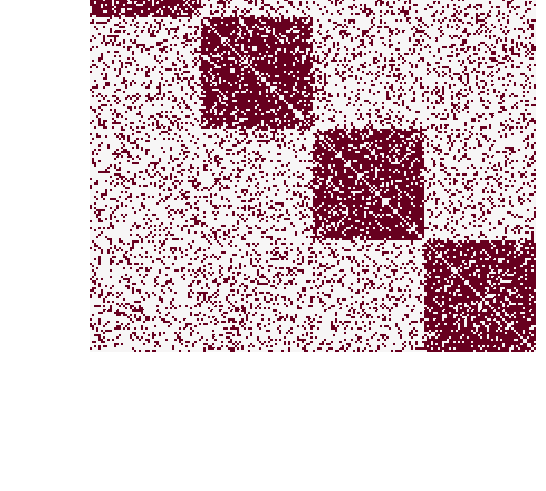

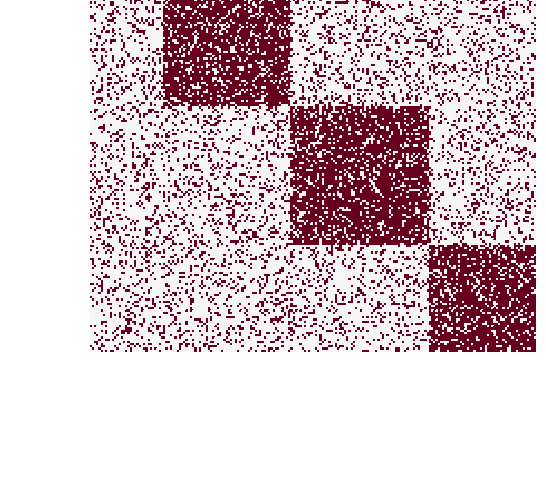

In [9]:
from graspologic.plot import heatmap

heatmap(G_sbm, title ='SBM Simulation')
heatmap(G_mmsbm, title ='MMSBM Simulation(alpha = 0)');

As it is shown above, the two graphs appear to be generated from the four-block SBM described above. It is also worthwhile noticing that the number of nodes per block the MMSBM graph is variable because each membership vector is drawn randomly from a Dirichlet distribution.\\
Now let's try increasing the parameter $\alpha$ first to $0.25$ and then $0.5$ and finally to $1$.

In [ ]:
alpha = 0.25*np.ones(4)

G_mmsbm_25 = MMsbm(n, p, alpha= alpha, loops=False)

alpha = 0.5*np.ones(4)

G_mmsbm_50 = MMsbm(n, p, alpha= alpha, loops=False)

alpha = 1.0*np.ones(4)

G_mmsbm_100 = MMsbm(n, p, alpha= alpha, loops=False)

# Plot MMSBM graphs with increasing alpha

In [ ]:
heatmap(G_mmsbm_25, title ='MMSBM Simulation(alpha = 0.25)')
heatmap(G_mmsbm_50, title ='MMSBM Simulation(alpha = 0.5)')
heatmap(G_mmsbm_100, title ='MMSBM Simulation(alpha = 1.0)');

As expected as we increase the value of alpha we increase the mixed membership allowed at each node so that the community structure is progressivily lost.

In [8]:
def MMsbm(
    n,
    p,
    alpha=None,
    directed=True,
    loops=False,
    return_labels=False,
):
    if not np.issubdtype(type(n), np.integer):
        raise TypeError("n is not of type int.")
    if not isinstance(p, (list, np.ndarray)):
        msg = "p must be a list or np.array, not {}.".format(type(p))
        raise TypeError(msg)
    else:
        p = np.array(p)
        if not np.issubdtype(p.dtype, np.number):
            msg = "There are non-numeric elements in p"
            raise ValueError(msg)
        elif np.any(p < 0) or np.any(p > 1):
            msg = "Values in p must be in between 0 and 1."
            raise ValueError(msg)
    if not isinstance(alpha, (list, np.ndarray)):
        msg = "alpha must be a list or np.array, not {}.".format(type(alpha))
        raise TypeError(msg)
    else:
        alpha = np.array(alpha)
        if not np.issubdtype(p.dtype, np.number):
            msg = "There are non-numeric elements in alpha"
            raise ValueError(msg)
        elif np.any(alpha < 0) or np.any(alpha > 1):
            msg = "Values in alpha must be in between 0 and 1."
            raise ValueError(msg)
        elif alpha.shape != (len(p),):
            msg = "alpha must be a list or np.array of dimension {desired_shape}, not {provided_shape}.".format(desired_shape= (len(p),),provided_shape= np.array(alpha).shape)
            raise ValueError(msg)
        elif np.any(alpha == 0):
            alpha[np.any(alpha == 0)] = float(1e-8) #np.random.dirichlet does not accept alpha = 0.0
    if type(loops) is not bool:
        raise TypeError("loops is not of type bool.")
    if type(directed) is not bool:
        raise TypeError("directed is not of type bool.")

    MMvectors = np.random.default_rng().dirichlet(alpha, n)

    indeces_same_groups = [[index for index,val in enumerate(MMvector) if val == np.max(MMvector)] for MMvector in MMvectors]

    idx,_ = zip(*sorted(enumerate(indeces_same_groups), key= lambda index: index[1]))

    idx = np.array(idx)

    MMvectors = MMvectors[idx]

    A = np.zeros((n,n))

    labels = np.zeros((n,n,len(p)))

    for i in range(n):
        for j in range(i, n):
            if(i == j):
                if(loops == True):
                    Z_pp = np.random.multinomial(1, MMvectors[i], size = 1)
                    edge_loop = np.random.binomial(1, (1.0)*Z_pp @ (p @ Z_pp.T))
                    labels[i,j] = Z_pp
                    A[i,j] = edge_loop
            Z_pq = np.random.multinomial(1, MMvectors[i], size = 1)
            Z_qp = np.random.multinomial(1, MMvectors[j], size = 1)
            edge_pq = np.random.binomial(1, (1.0)*Z_pq @ (p @ Z_qp.T))
            edge_qp = np.random.binomial(1, (1.0)*Z_qp @ (p @ Z_pq.T))
            labels[i,j] = Z_pq
            labels[j,i] = Z_qp
            A[i,j] = edge_pq
            if(directed==False):
                A[j,i] = A[i,j]
            elif(directed==True):
                A[j,i] = edge_qp
    if return_labels:
        labels = [[[index for index,val in enumerate(membership_point_i_interacting_j) if val == 1]for membership_point_i_interacting_j in label] for label in labels]
        return (A, labels)
    return(A)